<a href="https://colab.research.google.com/github/ABBEN4/Stable_diffusion_GWEN/blob/main/Img2Img_Stable_Diffusion_with_Diffusers_randomness_ImgToImg.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Mon Aug 29 19:41:53 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    28W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
!pip install -qq -U diffusers transformers ftfy
!pip install -qq "ipywidgets>=7,<8"

     |████████████████████████████████| 112 kB 15.4 MB/s 
     |████████████████████████████████| 4.7 MB 66.5 MB/s 
     |████████████████████████████████| 53 kB 2.0 MB/s 
     |████████████████████████████████| 120 kB 62.1 MB/s 
     |████████████████████████████████| 6.6 MB 57.9 MB/s 
     |████████████████████████████████| 1.6 MB 15.3 MB/s 


In [3]:
from huggingface_hub import notebook_login

notebook_login()

Login successful
Your token has been saved to /root/.huggingface/token
Authenticated through git-credential store but this isn't the helper defined on your machine.
You might have to re-authenticate when pushing to the Hugging Face Hub. Run the following command in your terminal in case you want to set this credential helper as the default

git config --global credential.helper store


In [4]:
# import inspect
# from typing import List, Optional, Union

# import numpy as np
# import torch

# import PIL
# from diffusers import AutoencoderKL, DDIMScheduler, DiffusionPipeline, PNDMScheduler, UNet2DConditionModel
# from diffusers.pipelines.stable_diffusion import StableDiffusionSafetyChecker
# from tqdm.auto import tqdm
# from transformers import CLIPFeatureExtractor, CLIPTextModel, CLIPTokenizer


# def preprocess(image):
#     w, h = image.size
#     w, h = map(lambda x: x - x % 32, (w, h))  # resize to integer multiple of 32
#     image = image.resize((w, h), resample=PIL.Image.LANCZOS)
#     image = np.array(image).astype(np.float32) / 255.0
#     image = image[None].transpose(0, 3, 1, 2)
#     image = torch.from_numpy(image)
#     return 2.0 * image - 1.0


# class StableDiffusionImg2ImgPipeline(DiffusionPipeline):
#     def __init__(
#         self,
#         vae: AutoencoderKL,
#         text_encoder: CLIPTextModel,
#         tokenizer: CLIPTokenizer,
#         unet: UNet2DConditionModel,
#         scheduler: Union[DDIMScheduler, PNDMScheduler],
#         safety_checker: StableDiffusionSafetyChecker,
#         feature_extractor: CLIPFeatureExtractor,
#     ):
#         super().__init__()
#         scheduler = scheduler.set_format("pt")
#         self.register_modules(
#             vae=vae,
#             text_encoder=text_encoder,
#             tokenizer=tokenizer,
#             unet=unet,
#             scheduler=scheduler,
#             safety_checker=safety_checker,
#             feature_extractor=feature_extractor,
#         )

#     @torch.no_grad()
#     def __call__(
#         self,
#         prompt: Union[str, List[str]],
#         init_image: torch.FloatTensor,
#         strength: float = 0.8,
#         num_inference_steps: Optional[int] = 50,
#         guidance_scale: Optional[float] = 7.5,
#         eta: Optional[float] = 0.0,
#         generator: Optional[torch.Generator] = None,
#         output_type: Optional[str] = "pil",
#     ):

#         if isinstance(prompt, str):
#             batch_size = 1
#         elif isinstance(prompt, list):
#             batch_size = len(prompt)
#         else:
#             raise ValueError(f"`prompt` has to be of type `str` or `list` but is {type(prompt)}")

#         # set timesteps
#         accepts_offset = "offset" in set(inspect.signature(self.scheduler.set_timesteps).parameters.keys())
#         extra_set_kwargs = {}
#         offset = 0
#         if accepts_offset:
#             offset = 1
#             extra_set_kwargs["offset"] = 1

#         self.scheduler.set_timesteps(num_inference_steps, **extra_set_kwargs)

#         # encode the init image into latents and scale the latents
#         init_latents = self.vae.encode(init_image.to(self.device)).sample()
#         init_latents = 0.18215 * init_latents

#         # prepare init_latents noise to latents
#         init_latents = torch.cat([init_latents] * batch_size)

#         # get the original timestep using init_timestep
#         init_timestep = int(num_inference_steps * strength) + offset
#         init_timestep = min(init_timestep, num_inference_steps)
#         timesteps = self.scheduler.timesteps[-init_timestep]
#         timesteps = torch.tensor([timesteps] * batch_size, dtype=torch.long, device=self.device)

#         # add noise to latents using the timesteps
#         noise = torch.randn(init_latents.shape, generator=generator, device=self.device)
#         init_latents = self.scheduler.add_noise(init_latents, noise, timesteps)

#         # get prompt text embeddings
#         text_input = self.tokenizer(
#             prompt,
#             padding="max_length",
#             max_length=self.tokenizer.model_max_length,
#             truncation=True,
#             return_tensors="pt",
#         )
#         text_embeddings = self.text_encoder(text_input.input_ids.to(self.device))[0]

#         # here `guidance_scale` is defined analog to the guidance weight `w` of equation (2)
#         # of the Imagen paper: https://arxiv.org/pdf/2205.11487.pdf . `guidance_scale = 1`
#         # corresponds to doing no classifier free guidance.
#         do_classifier_free_guidance = guidance_scale > 1.0
#         # get unconditional embeddings for classifier free guidance
#         if do_classifier_free_guidance:
#             max_length = text_input.input_ids.shape[-1]
#             uncond_input = self.tokenizer(
#                 [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
#             )
#             uncond_embeddings = self.text_encoder(uncond_input.input_ids.to(self.device))[0]

#             # For classifier free guidance, we need to do two forward passes.
#             # Here we concatenate the unconditional and text embeddings into a single batch
#             # to avoid doing two forward passes
#             text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

#         # prepare extra kwargs for the scheduler step, since not all schedulers have the same signature
#         # eta (η) is only used with the DDIMScheduler, it will be ignored for other schedulers.
#         # eta corresponds to η in DDIM paper: https://arxiv.org/abs/2010.02502
#         # and should be between [0, 1]
#         accepts_eta = "eta" in set(inspect.signature(self.scheduler.step).parameters.keys())
#         extra_step_kwargs = {}
#         if accepts_eta:
#             extra_step_kwargs["eta"] = eta

#         latents = init_latents
#         t_start = max(num_inference_steps - init_timestep + offset, 0)
#         for i, t in tqdm(enumerate(self.scheduler.timesteps[t_start:])):
#             # expand the latents if we are doing classifier free guidance
#             latent_model_input = torch.cat([latents] * 2) if do_classifier_free_guidance else latents

#             # predict the noise residual
#             noise_pred = self.unet(latent_model_input, t, encoder_hidden_states=text_embeddings)["sample"]

#             # perform guidance
#             if do_classifier_free_guidance:
#                 noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
#                 noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

#             # compute the previous noisy sample x_t -> x_t-1
#             latents = self.scheduler.step(noise_pred, t, latents, **extra_step_kwargs)["prev_sample"]

#         # scale and decode the image latents with vae
#         latents = 1 / 0.18215 * latents
#         image = self.vae.decode(latents)

#         image = (image / 2 + 0.5).clamp(0, 1)
#         image = image.cpu().permute(0, 2, 3, 1).numpy()

#         # run safety checker
#         safety_cheker_input = self.feature_extractor(self.numpy_to_pil(image), return_tensors="pt").to(self.device)
#         image, has_nsfw_concept = self.safety_checker(images=image, clip_input=safety_cheker_input.pixel_values)

#         if output_type == "pil":
#             image = self.numpy_to_pil(image)

#         return {"sample": image, "nsfw_content_detected": has_nsfw_concept}

In [5]:
!wget https://raw.githubusercontent.com/huggingface/diffusers/4674fdf807cdefd4db1758067c0207872d805f8c/examples/inference/image_to_image.py

--2022-08-29 19:42:55--  https://raw.githubusercontent.com/huggingface/diffusers/4674fdf807cdefd4db1758067c0207872d805f8c/examples/inference/image_to_image.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6808 (6.6K) [text/plain]
Saving to: ‘image_to_image.py’

image_to_image.py   100%[===================>]   6.65K  --.-KB/s    in 0s      

2022-08-29 19:42:55 (78.8 MB/s) - ‘image_to_image.py’ saved [6808/6808]



In [6]:
from torch import autocast
import torch
import requests
from PIL import Image
from io import BytesIO

from image_to_image import StableDiffusionImg2ImgPipeline, preprocess


In [7]:
# load the pipeline
device = "cuda"
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4",
    revision="fp16", 
    torch_dtype=torch.float16,
    use_auth_token=True
).to(device)

Downloading:   0%|          | 0.00/1.34k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/12.5k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/342 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/543 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/4.63k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/608M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/209 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/209 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/572 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/246M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/525k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/472 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/788 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/772 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/71.2k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/550 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/167M [00:00<?, ?B/s]

In [41]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [45]:
# let's download an initial image
url = "https://colab.research.google.com/60bab684-d2f7-403a-b1a4-a5ad8988bb49"

In [46]:
response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image

UnidentifiedImageError: ignored

In [20]:
init_image = init_image.resize((768, 512))
init_image = preprocess(init_image)

In [22]:
prompt = "A slice of oatmeat cake on a white plate covered with chocolate ganache and topped with raspberries, food photography"

Picture: 1 A slice of oatmeat cake on a white plate covered with chocolate ganache and topped with raspberries, food photography 576*704 seed: 1206133880 strength: 0.72 Guidance: 0.67 steps: 39


0it [00:00, ?it/s]

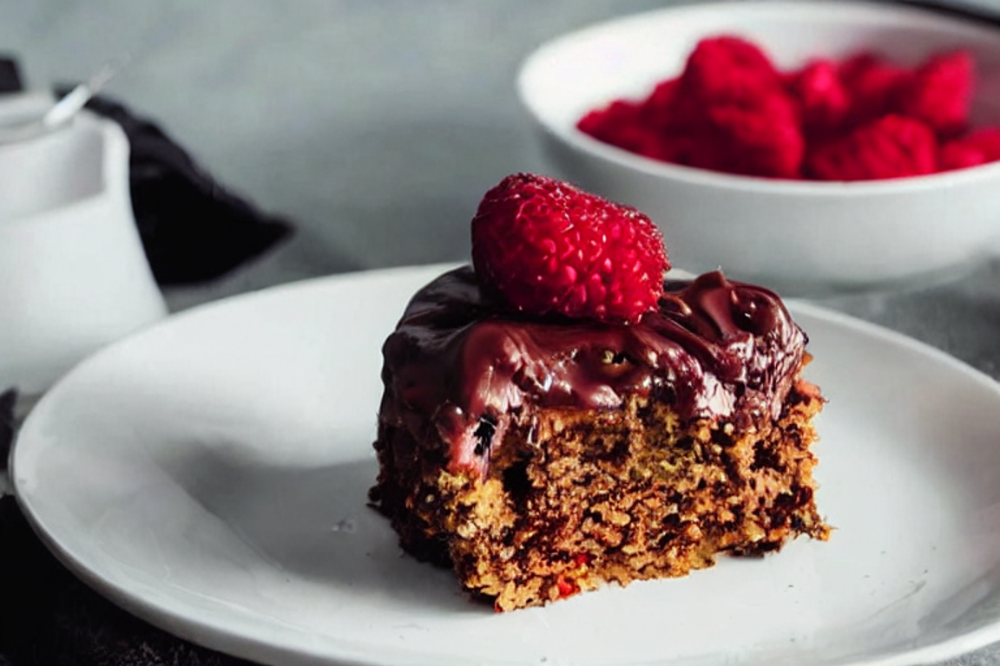

Picture: 2 A slice of oatmeat cake on a white plate covered with chocolate ganache and topped with raspberries, food photography 704*704 seed: 2105606483 strength: 0.68 Guidance: 0.64 steps: 34


0it [00:00, ?it/s]

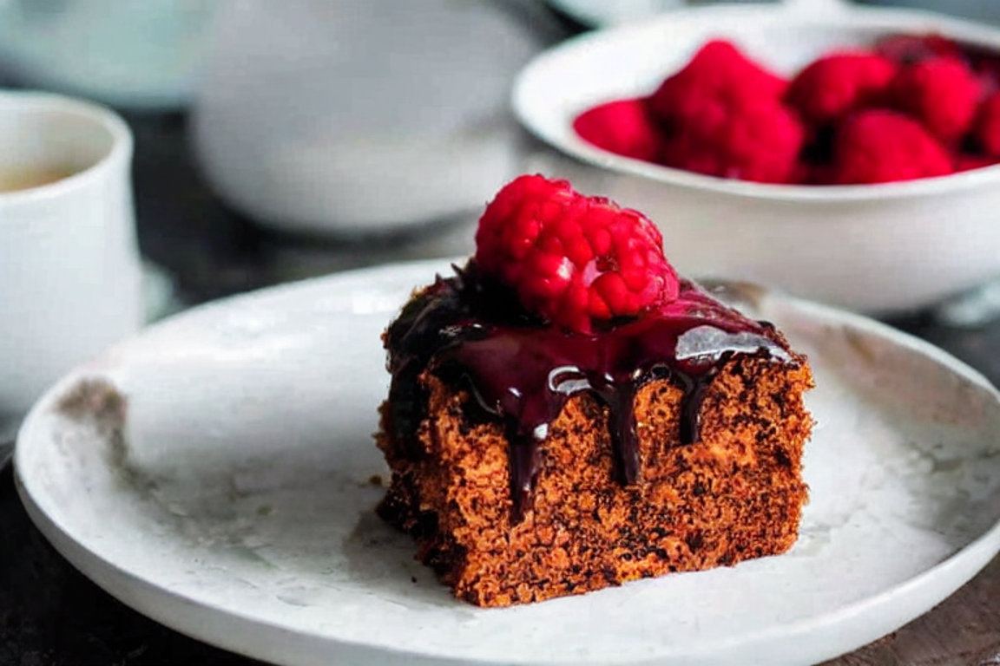

Picture: 3 A slice of oatmeat cake on a white plate covered with chocolate ganache and topped with raspberries, food photography 640*576 seed: 1578649680 strength: 0.63 Guidance: 0.73 steps: 36


0it [00:00, ?it/s]

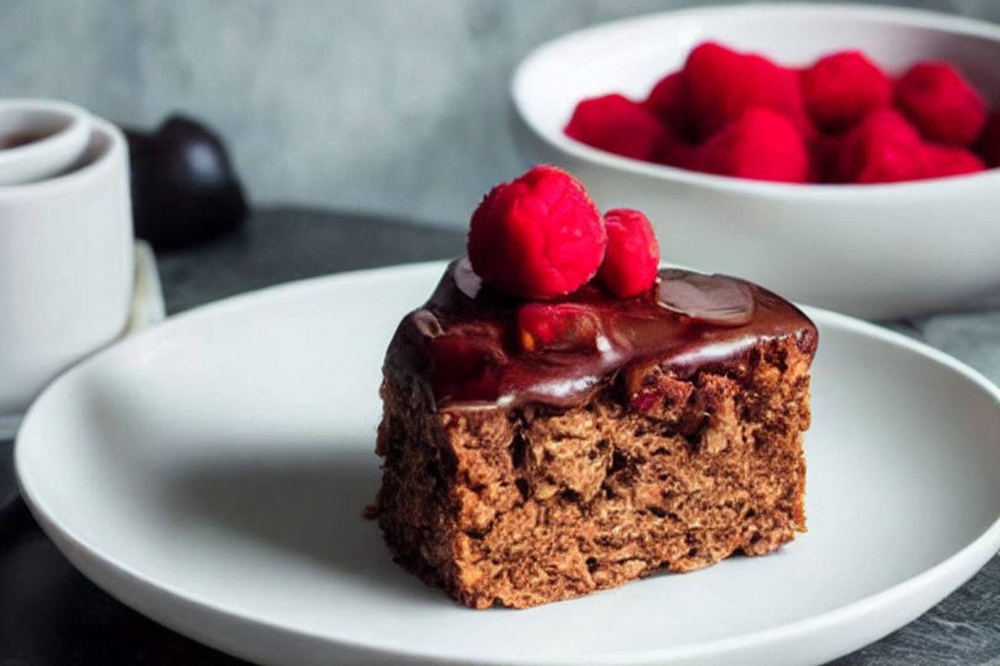

Picture: 4 A slice of oatmeat cake on a white plate covered with chocolate ganache and topped with raspberries, food photography 640*576 seed: 1192579214 strength: 0.8 Guidance: 0.61 steps: 31


0it [00:00, ?it/s]

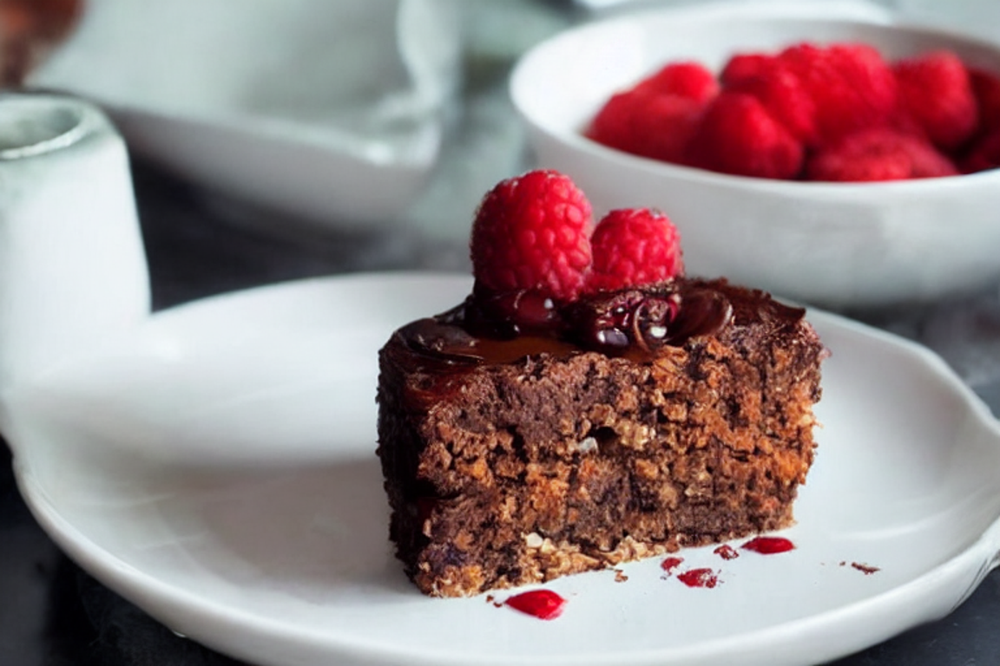

Picture: 5 A slice of oatmeat cake on a white plate covered with chocolate ganache and topped with raspberries, food photography 512*512 seed: 320052198 strength: 0.69 Guidance: 0.68 steps: 38


0it [00:00, ?it/s]

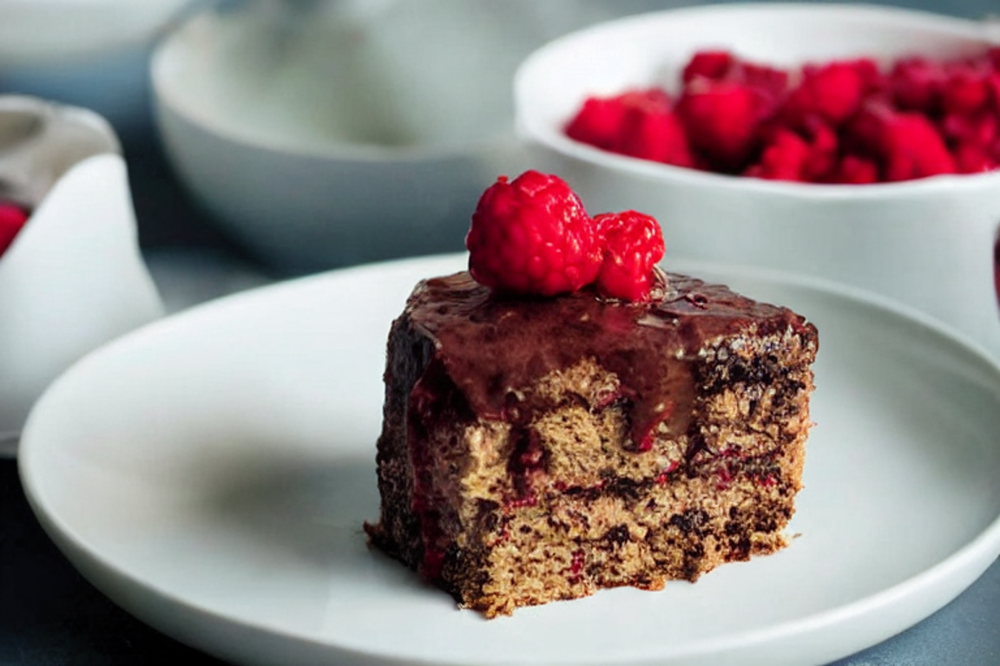

Picture: 6 A slice of oatmeat cake on a white plate covered with chocolate ganache and topped with raspberries, food photography 512*640 seed: 13273305 strength: 0.62 Guidance: 0.76 steps: 33


0it [00:00, ?it/s]

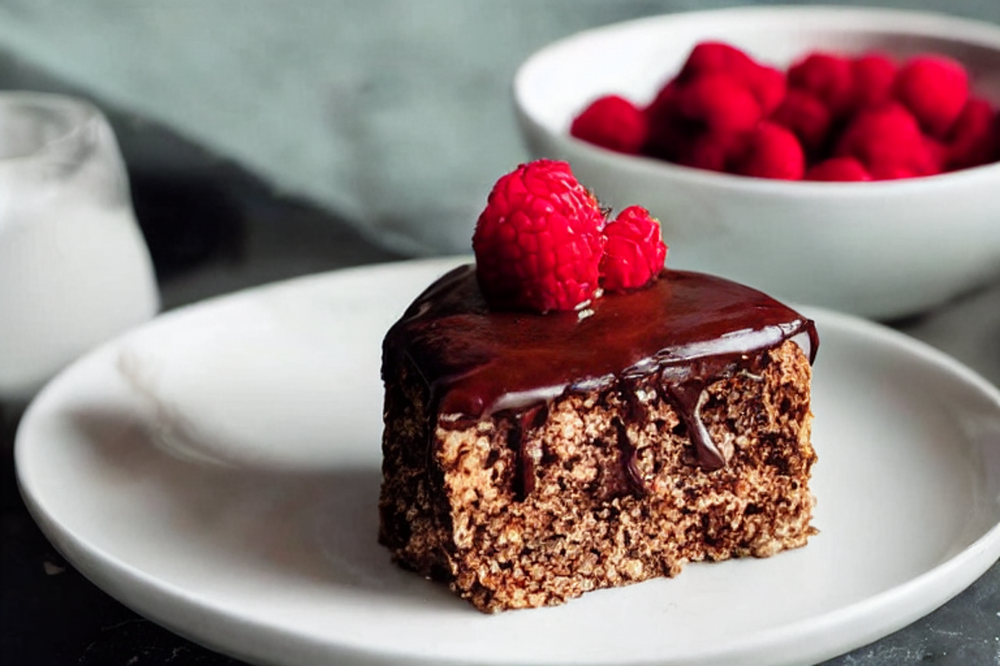

Picture: 7 A slice of oatmeat cake on a white plate covered with chocolate ganache and topped with raspberries, food photography 512*704 seed: 293952655 strength: 0.69 Guidance: 0.71 steps: 40


0it [00:00, ?it/s]

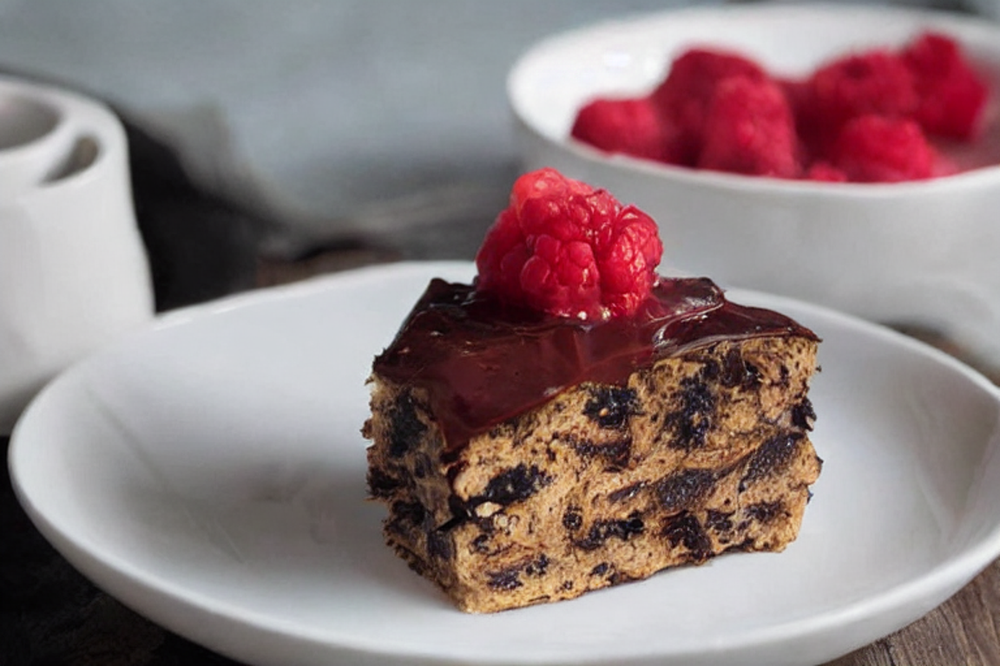

Picture: 8 A slice of oatmeat cake on a white plate covered with chocolate ganache and topped with raspberries, food photography 512*640 seed: 12210528 strength: 0.77 Guidance: 0.73 steps: 38


0it [00:00, ?it/s]

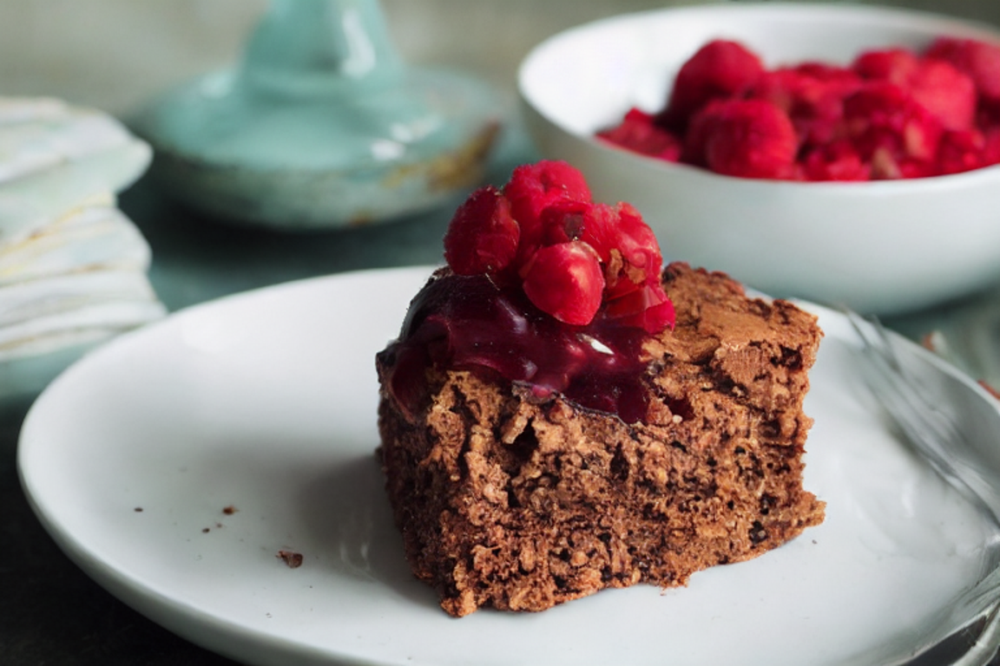

Picture: 9 A slice of oatmeat cake on a white plate covered with chocolate ganache and topped with raspberries, food photography 512*640 seed: 179456026 strength: 0.74 Guidance: 0.76 steps: 30


0it [00:00, ?it/s]

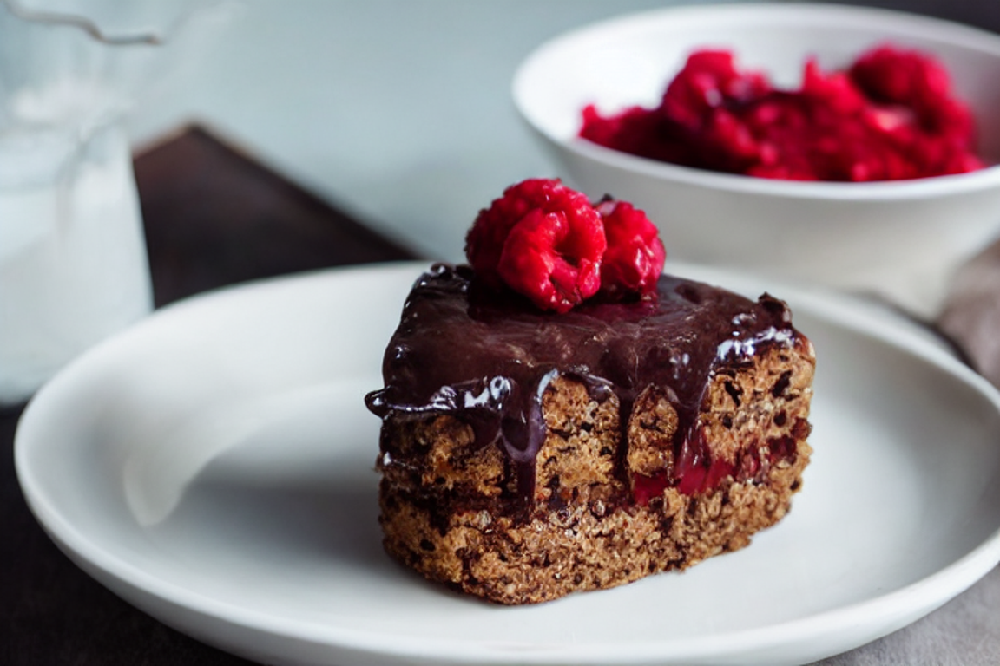

Picture: 10 A slice of oatmeat cake on a white plate covered with chocolate ganache and topped with raspberries, food photography 576*640 seed: 759054503 strength: 0.65 Guidance: 0.77 steps: 30


0it [00:00, ?it/s]

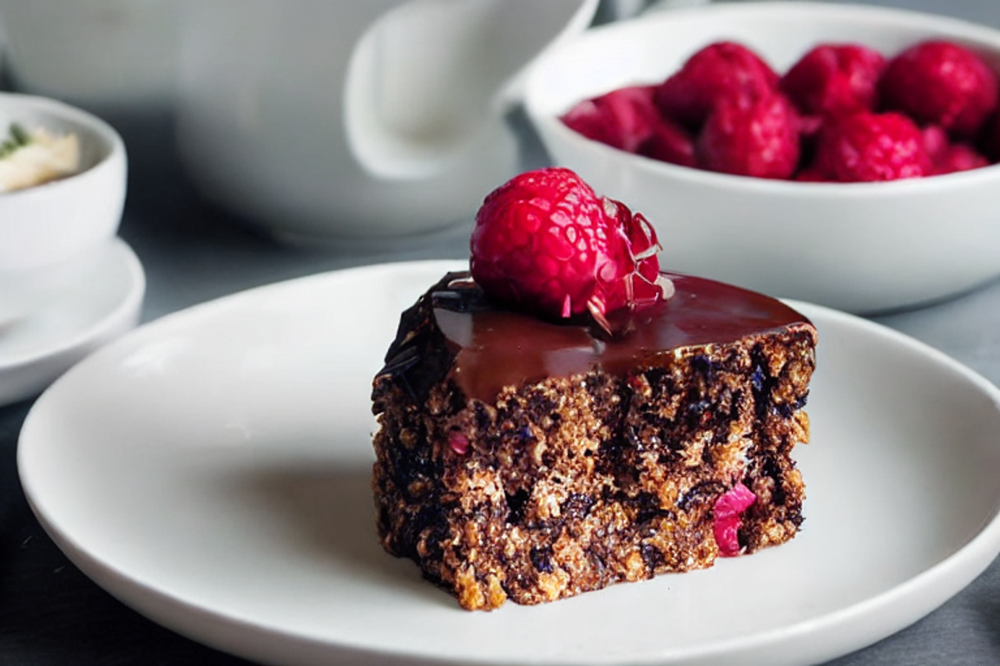

In [34]:

import random
import torch
import random
from PIL import Image
from torch import autocast
from IPython.display import display 

size_list = [512, 576, 640, 704]

lowguid = 5
highguid = 8
lowS= 0.6
highS = 0.8

stepsL = 30
stepsh = 40


all_images = []
seeds = []
guidance = []
heights = []
widths = []

i = 10
x = 0
n=1 
while i > 0:
  seed = random.randint(0,2147483647)
  sizew = random.choice(size_list)
  sizeh = random.choice(size_list)
  strength = round(random.uniform(lowS,highS),2)
  guidS = round(random.uniform(lowS,highS),2)
  steps = random.randint(stepsL,stepsh)
  seeds.append(seed)
  guidance.append(guidS)
  generator = torch.Generator("cuda").manual_seed(seed)
  heights.append(sizeh)
  widths.append(sizew)
  print("Picture: " + str(n) + " " + prompt + " " + str(sizew) + "*" + str(sizeh) + " seed: " + str(seed) + " strength: " + str(strength) + " Guidance: " + str(guidS) + " steps: " + str(steps))
  with autocast("cuda"):
    images = pipe(prompt=prompt, init_image=init_image, num_inference_steps=steps, strength=strength, generator=generator, guidance_scale=guidS)["sample"]
    torch.cuda.empty_cache()
  all_images.extend(images)
  x = x
  im = all_images[x]
  scale = 1.5
  display(im.resize(( int(im.width * scale), int(im.height * scale))))
  x = x+1
  i = i-1
  n = n + 1


In [24]:
images[0].save("elon_musk.png")

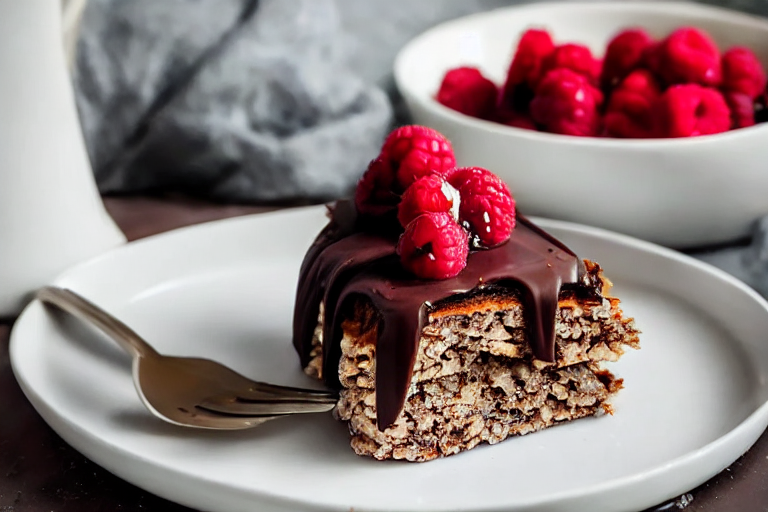

In [25]:
images[0]